# Exploraiton of T-SNE for Bias Inspection: CheXpert

In [20]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from sklearn import decomposition
from sklearn.manifold import TSNE
from scipy import stats
from statsmodels.stats.multitest import multipletests
np.set_printoptions(suppress=True,formatter={'float_kind': '{:f}'.format})

In [21]:
# Define constants
alpha = 0.6
style = 'o'
markersize = 40
fontscale = 1.6
color_palette = 'tab10'
kind = 'scatter'
rasterized_scatter = True
out_dpi = 300
out_format = 'png'

In [22]:
MODEL_FEATURES = {
    'resnet18': 512,
    'resnet34': 512,
    'resnet50': 2048,
    'resnet101': 2048,
}
RANDOM_STATE = 42

In [23]:
def create_tsne(
        embeds_array: np.ndarray,
        model_df: pd.DataFrame
    ):
    
    # n -> number of samples
    # m -> number of features
    pca = decomposition.PCA(n_components=0.99, whiten=False)
    embeds_pca = pca.fit_transform(embeds_array)
    embeds_tsne = TSNE(n_components=2, init='random', learning_rate='auto').fit_transform(embeds_pca)

    model_df['t-SNE Dimension 1'] = embeds_tsne[:,0]
    model_df['t-SNE Dimension 2'] = embeds_tsne[:,1]

    # Replace numerical labels with categorical
    model_df['Labels'] = model_df['Labels'].replace({0: 'No Finding', 1: 'Other'})
    model_df['Sex'] = model_df['Sex'].replace({0: 'Male', 1: 'Female'})
    model_df['Age'] = model_df['Age'].replace({0: '<60', 1: '60+'})
    model_df['Race'] = model_df['Race'].replace({0: 'White', 1: 'Non-White'})

In [24]:
def plot(
    label: str,
    df: pd.DataFrame,
    hue_order: list[str],
    model_id: str,
    save_dir: str
):
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)
        
    ### PCA 1 + 2
    x_data = 't-SNE Dimension 1'
    y_data = 't-SNE Dimension 2'
    # Scatter with distributions
    sns.set_theme(style="white", palette=color_palette, font_scale=fontscale)
    fig = sns.jointplot(x=x_data, y=y_data, hue=label, kind=kind, alpha=alpha, marker=style, s=markersize, hue_order=hue_order, data=df, joint_kws=dict(rasterized=rasterized_scatter), marginal_kws={'common_norm': False})
    fig.ax_joint.legend(loc='upper right')
    plt.savefig(save_dir + 'tsne-1+2' + '-' + model_id + '-' + label + '.' + out_format, bbox_inches='tight', dpi=out_dpi)

    # Just distributions
    sns.set_theme(style="white", palette=color_palette, font_scale=fontscale)
    fig, ax = plt.subplots(figsize=(10,3))
    g = sns.kdeplot(x=x_data, hue=label, fill=True, hue_order=hue_order, data=df, ax=ax, common_norm=False)
    g.get_legend().set_title(None)
    g.spines[['right', 'top']].set_visible(False)
    plt.savefig(save_dir + 'tsne-1' + '-' + model_id + '-' + label + '-marginal.' + out_format, bbox_inches='tight', dpi=out_dpi)

    sns.set_theme(style="white", palette=color_palette, font_scale=fontscale)
    fig, ax = plt.subplots(figsize=(10,3))
    g = sns.kdeplot(x=y_data, hue=label, fill=True, hue_order=hue_order, data=df, ax=ax, common_norm=False)
    g.get_legend().set_title(None)
    g.spines[['right', 'top']].set_visible(False)
    plt.savefig(save_dir + 'tsne-2' + '-' + model_id + '-' + label + '-marginal.' + out_format, bbox_inches='tight', dpi=out_dpi)
  

    

In [25]:
def run_statistical_tests(
    df: pd.DataFrame, # model df with PCA columns
    save_dir: str,
):
    
    def stats_tests(marginal, samples):
        df_female = samples[samples['Sex'] == 'Female']
        df_male = samples[samples['Sex'] == 'Male']
        df_young = samples[samples['Age'] == '<60']
        df_old = samples[samples['Age'] == '60+']
        df_white = samples[samples['Race'] == 'White']
        df_non_white = samples[samples['Race'] == 'Non-White']
        df_no_fnd = samples[samples['Labels'] == 'No Finding']
        df_other = samples[samples['Labels'] == 'Other']

        res_label = stats.ks_2samp(np.array(df_no_fnd[marginal]), np.array(df_other[marginal]))
        res_age = stats.ks_2samp(np.array(df_young[marginal]), np.array(df_old[marginal]))
        res_sex = stats.ks_2samp(np.array(df_female[marginal]), np.array(df_male[marginal]))
        res_race = stats.ks_2samp(np.array(df_white[marginal]), np.array(df_non_white[marginal]))

        return [res_label.pvalue, res_sex.pvalue, res_age.pvalue, res_race.pvalue]
    
    pvals_tsne1 = stats_tests('t-SNE Dimension 1', df)
    pvals_tsne2 = stats_tests('t-SNE Dimension 2', df)
    pvals = np.array([pvals_tsne1, pvals_tsne2])
    res = multipletests(pvals.flatten(), alpha=0.05, method='fdr_by', is_sorted=False, returnsorted=False)

    rejected_null_hypothesis = np.array(res[0]).reshape((2,4))
    adjusted_pvals = np.array(res[1]).reshape((2,4))

    index = ['T-SNE 1', 'T-SNE 2']
    columns_hypothesis = ['label_hypoth','sex_hypoth', 'age_hypoth', 'race_hypoth']
    columns_pvalues = ['label_pv', 'sex_pv', 'age_pv', 'race_pv']

    df_hypothesis = pd.DataFrame(rejected_null_hypothesis, index=index, columns=columns_hypothesis)
    df_pvalues = pd.DataFrame(adjusted_pvals, index=index, columns=columns_pvalues).round(6)
    df = pd.concat([df_hypothesis, df_pvalues], axis=1)
    display(df)
    df.to_csv(save_dir + 'tsne-stat.csv', index_label='tsne_dim')
    


In [26]:
def run_tsne_and_save_plots(
    model_id: str,
    model_name: str,
    model_dir: str,
    data_name: str, # chexpert_no_female, chexpert_no_old etc.
    sample: bool = False,
    teacher: bool = False,
):
    print(model_id)
    # Load Data
    embeds_data = pd.read_csv(f'{model_dir}/{model_id}/embeds.csv')
    model_df = pd.read_csv(f'{model_dir}/{model_id}/test_predictions.csv')
    embeds = np.array(embeds_data.iloc[:,0:MODEL_FEATURES[model_name]])

    if teacher:
        save_dir = f'teacher_{model_id}/'
    else:
        save_dir = f'{data_name}/{model_id}/'

    create_tsne(embeds, model_df)

    if sample:
        model_df = model_df.sample(frac=0.1, random_state=RANDOM_STATE)

    print('\n--- Statistical tests')
    run_statistical_tests(model_df, save_dir)

    plot(
        label='Labels',
        df=model_df,
        hue_order=['No Finding', 'Other'],
        model_id=model_id,
        save_dir=save_dir,
    )

    plot(
        label='Sex',
        df=model_df,
        hue_order=['Male', 'Female'],
        model_id=model_id,
        save_dir=save_dir,
    )

    plot(
        label='Age',
        df=model_df,
        hue_order=['<60', '60+'],
        model_id=model_id,
        save_dir=save_dir,
    )

    plot(
        label='Race',
        df=model_df,
        hue_order=['White', 'Non-White'],
        model_id=model_id,
        save_dir=save_dir,
    )

        

## Fair Teacher - Unfair Students

#### Teachers

r34-sam1-s43

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,True,True,True,0.0,0.0,0.0,0.000000
T-SNE 2,True,True,True,True,0.0,0.0,0.0,0.015015


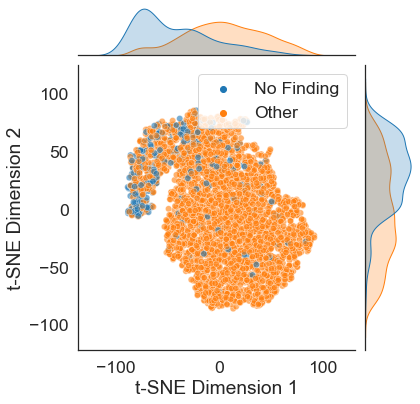

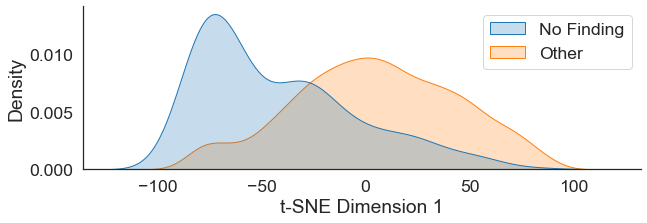

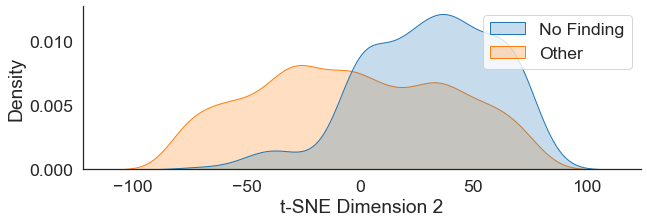

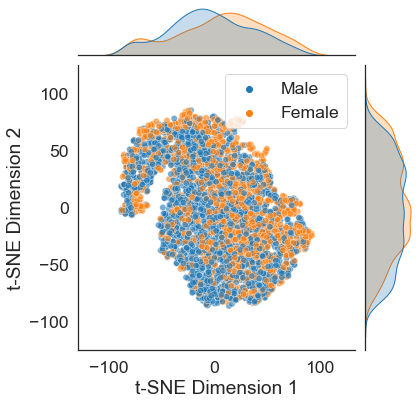

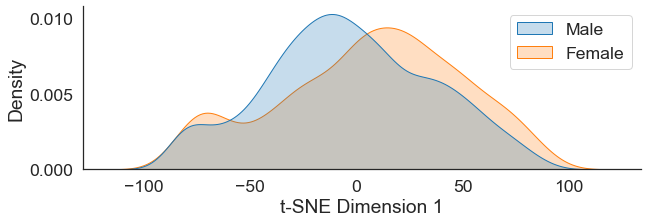

...

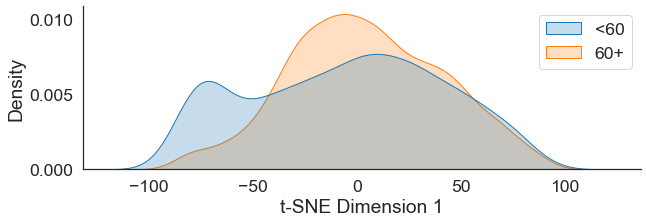

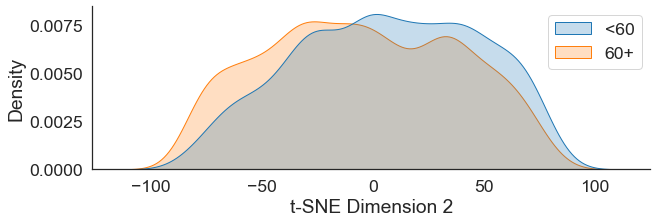

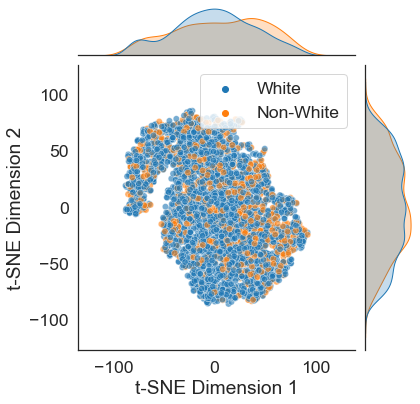

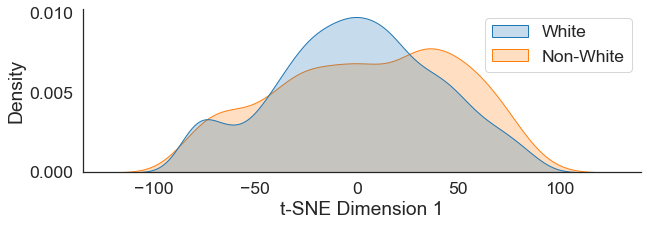

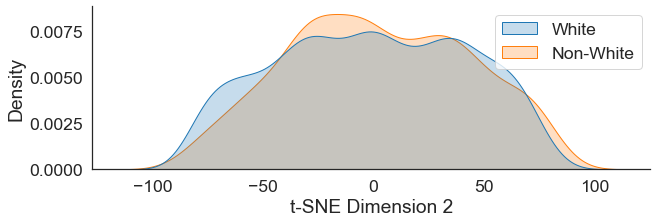

In [27]:
run_tsne_and_save_plots(
    model_id='r34-sam1-s43',
    model_name='resnet34',
    model_dir='../../results/chexpert/resnet',
    data_name='chexpert',
    sample=True,
    teacher=True,
)

#### Students

##### No Female

##### ResNet18

r18-sam1-s46

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,True,True,False,0.0,0.000000,0.000009,0.053966
T-SNE 2,True,False,True,False,0.0,0.642385,0.000000,0.800664


r18-sam1-kd1-s46_r34-sam1-s43

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,True,True,True,0.0,0.000000,0.000000,0.000035
T-SNE 2,True,False,True,False,0.0,0.090962,0.034334,0.294187


/tmp/ipykernel_2799854/2522073358.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


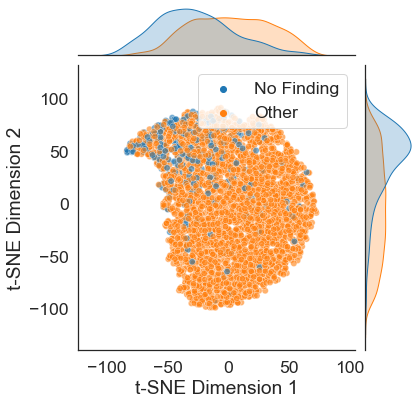

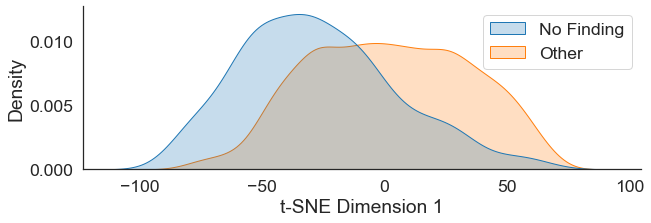

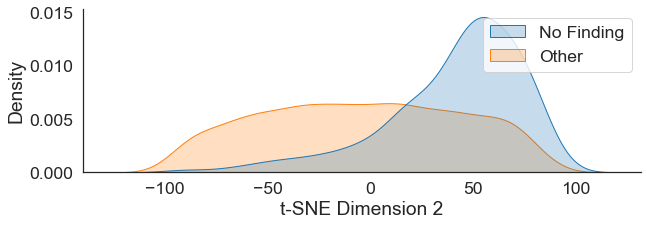

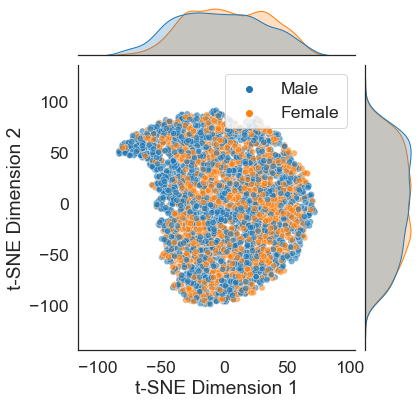

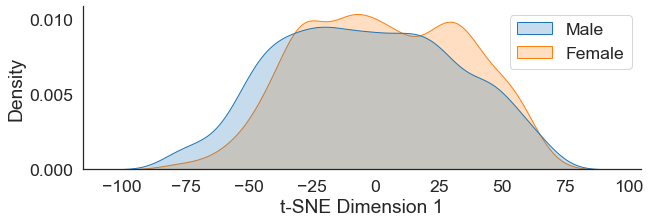

...

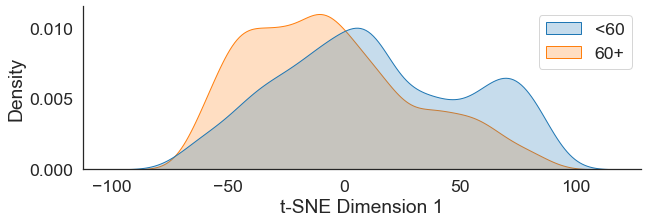

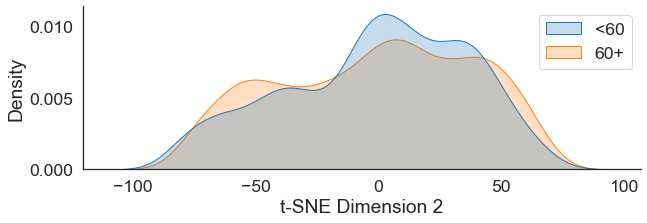

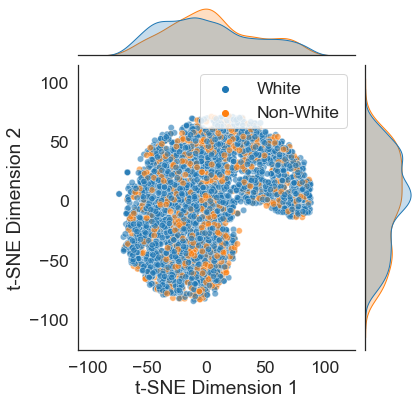

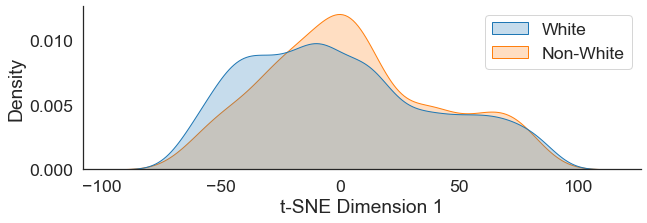

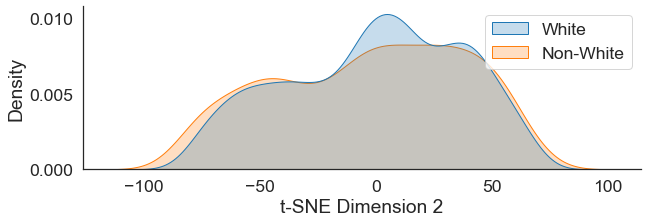

In [28]:
# Resnet18: Seed 46

# Without KD
run_tsne_and_save_plots(
    model_id='r18-sam1-s46',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_female/resnet',
    data_name='chexpert_no_female',
    sample=True,
    teacher=False,
)

# With KD
run_tsne_and_save_plots(
    model_id='r18-sam1-kd1-s46_r34-sam1-s43',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_female/kd',
    data_name='chexpert_no_female',
    sample=True,
    teacher=False,
)

##### ResNet34

r34-sam1-s45

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,True,True,False,0.0,0.021963,0.0,0.188448
T-SNE 2,True,True,True,True,0.0,0.036543,0.0,0.028476


r34-sam1-kd1-s45_r34-sam1-s43

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,False,True,False,0.000000,0.336049,0.000000,1.000000
T-SNE 2,True,True,True,False,0.000009,0.000000,0.001577,0.171976


/tmp/ipykernel_2799854/2522073358.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


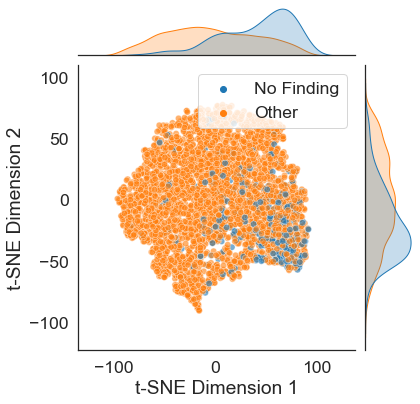

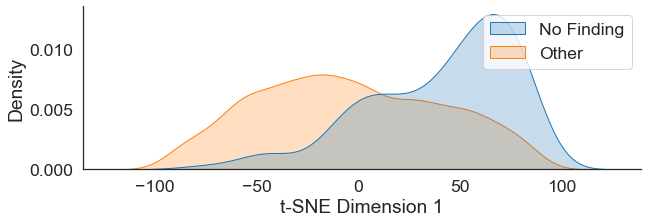

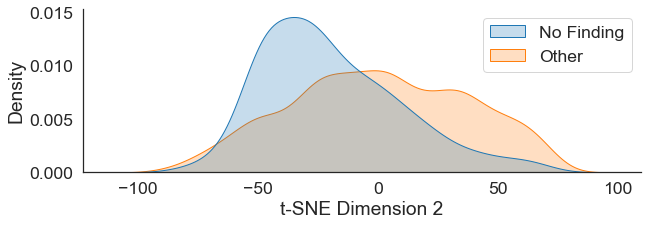

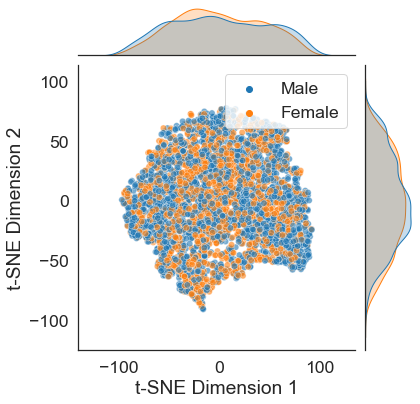

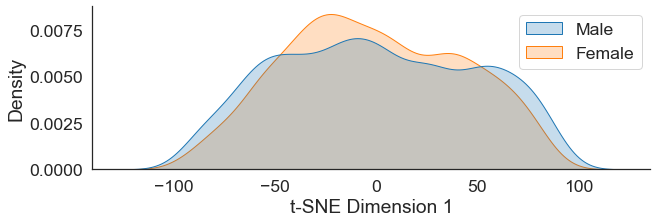

...

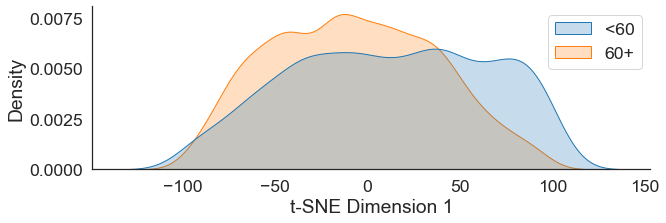

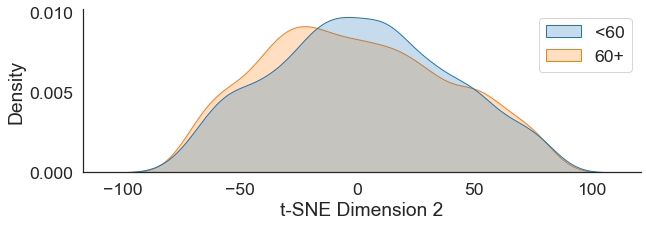

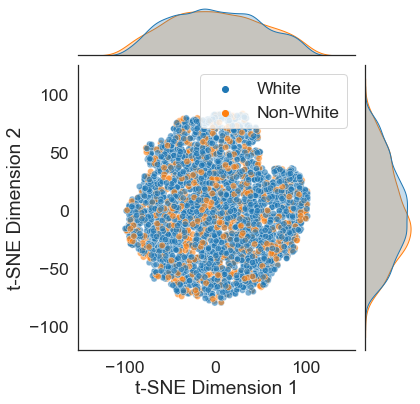

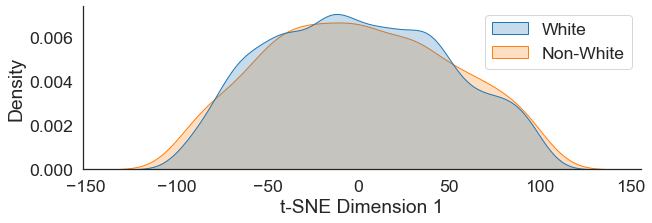

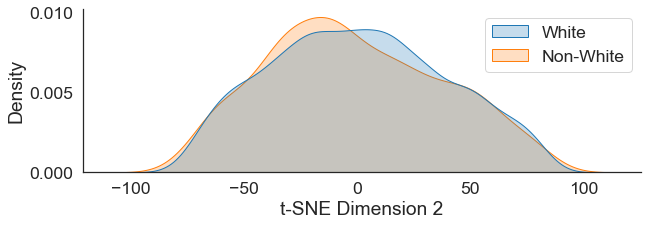

In [29]:
# Resnet34: Seed 45

# Without KD
run_tsne_and_save_plots(
    model_id='r34-sam1-s45',
    model_name='resnet34',
    model_dir='../../results/chexpert_no_female/resnet',
    data_name='chexpert_no_female',
    sample=True,
    teacher=False,
)

# With KD
run_tsne_and_save_plots(
    model_id='r34-sam1-kd1-s45_r34-sam1-s43',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_female/kd',
    data_name='chexpert_no_female',
    sample=True,
    teacher=False,
)

##### No Old

##### ResNet18

r18-sam1-s46



--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,True,True,True,0.0,0.000000,0.000003,0.0
T-SNE 2,True,True,True,False,0.0,0.001158,0.000000,1.0


r18-sam1-kd1-s46_r34-sam1-s43

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,True,True,False,0.0,0.000038,0.0,1.0
T-SNE 2,True,False,True,False,0.0,1.000000,0.0,1.0


/tmp/ipykernel_2799854/2522073358.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


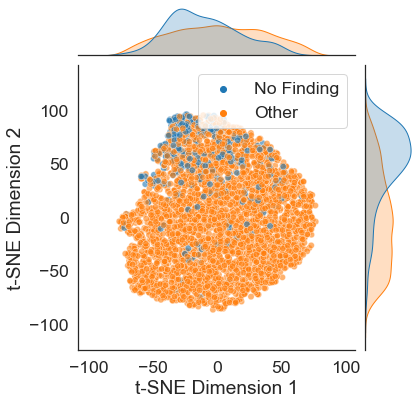

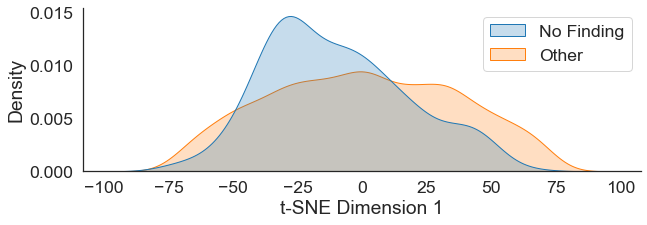

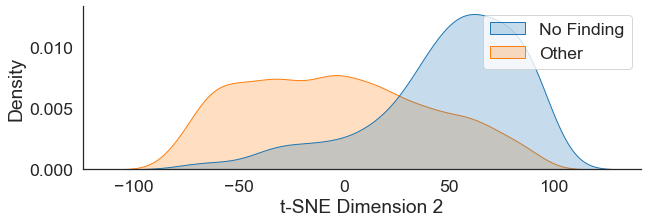

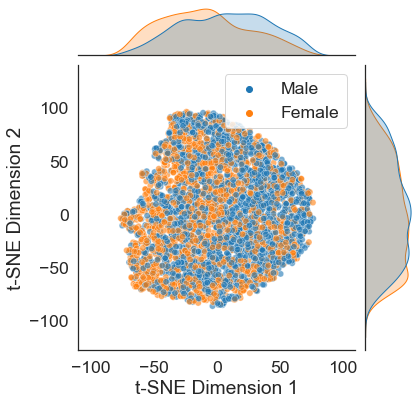

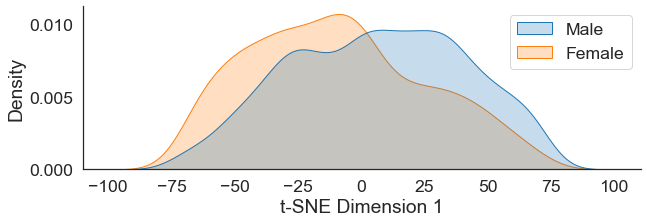

...

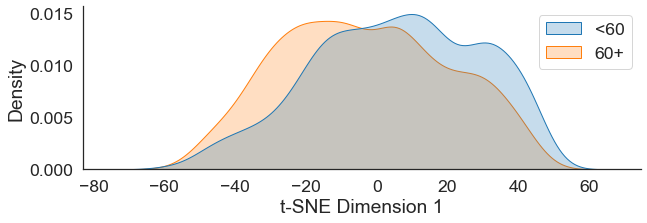

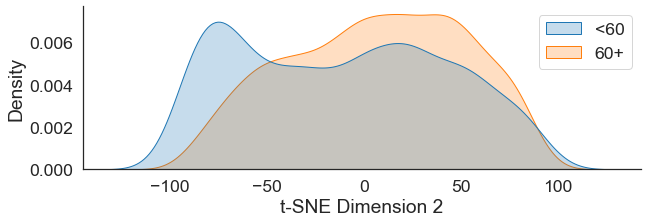

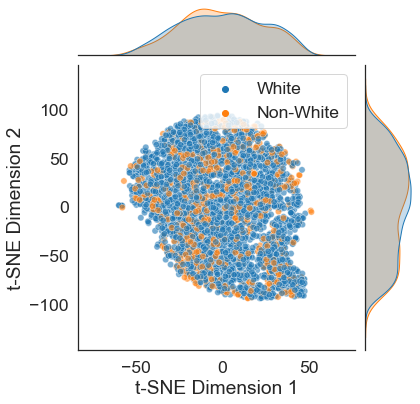

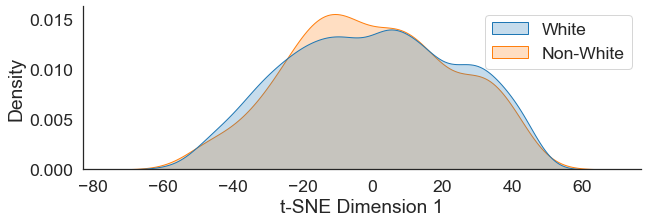

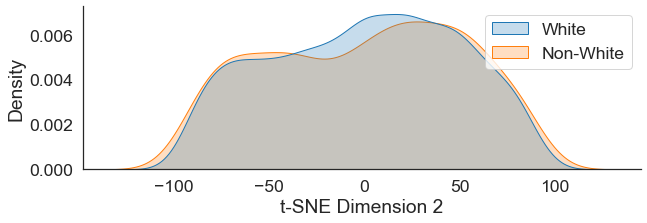

In [30]:
# Resnet18: Seed 46

# Without KD
run_tsne_and_save_plots(
    model_id='r18-sam1-s46',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_old/resnet',
    data_name='chexpert_no_old',
    sample=True,
    teacher=False,
)

# With KD
run_tsne_and_save_plots(
    model_id='r18-sam1-kd1-s46_r34-sam1-s43',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_old/kd',
    data_name='chexpert_no_old',
    sample=True,
    teacher=False,
)

##### ResNet34

r34-sam1-s45

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,False,True,False,0.0,1.000000,0.0,0.082276
T-SNE 2,True,True,True,False,0.0,0.000026,0.0,1.000000


r34-sam1-kd1-s45_r34-sam1-s43

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,True,True,False,0.0,0.000010,0.010309,1.0
T-SNE 2,True,False,True,False,0.0,0.845758,0.000000,1.0


/tmp/ipykernel_2799854/2522073358.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


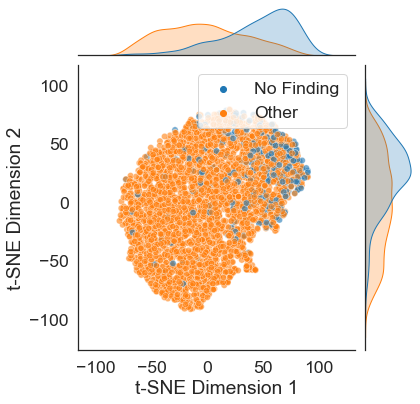

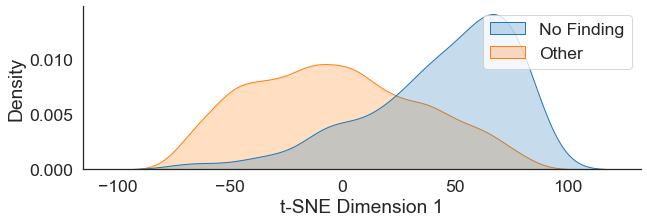

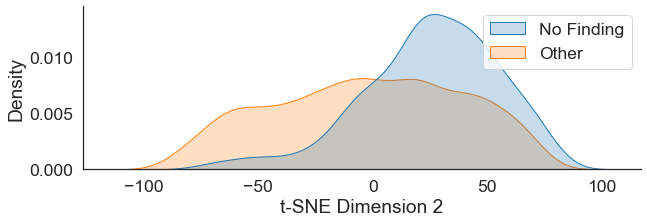

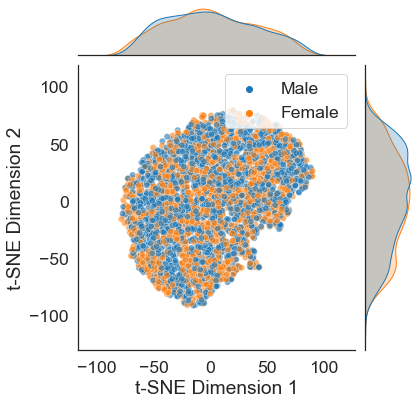

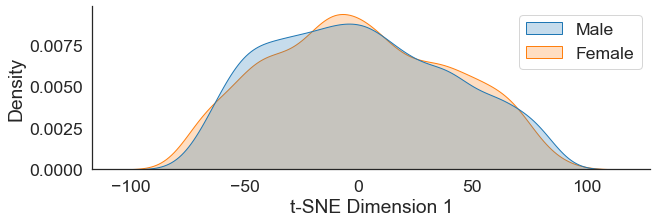

...

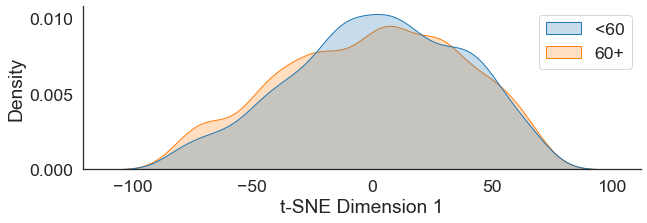

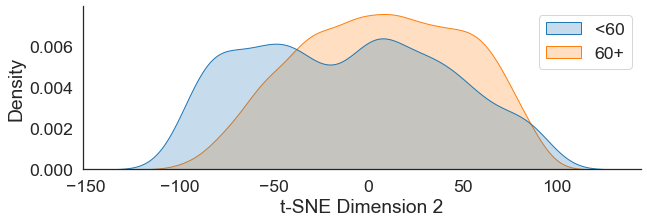

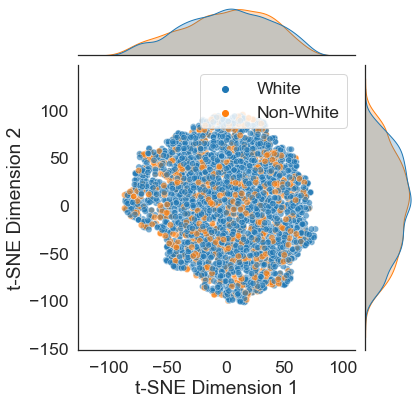

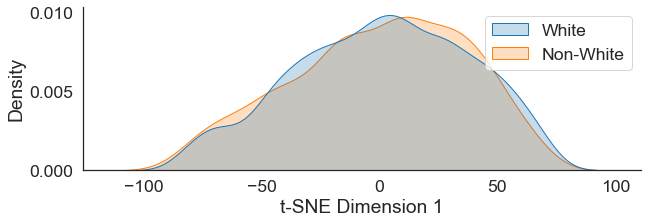

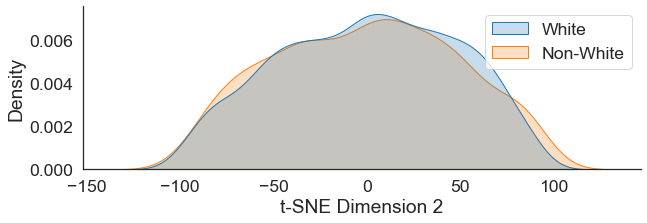

In [31]:
# Resnet34: Seed 45

# Without KD
run_tsne_and_save_plots(
    model_id='r34-sam1-s45',
    model_name='resnet34',
    model_dir='../../results/chexpert_no_old/resnet',
    data_name='chexpert_no_old',
    sample=True,
    teacher=False,
)

# With KD
run_tsne_and_save_plots(
    model_id='r34-sam1-kd1-s45_r34-sam1-s43',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_old/kd',
    data_name='chexpert_no_old',
    sample=True,
    teacher=False,
)

##### No White

##### ResNet18

r18-sam1-s46



--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,False,True,False,0.0,0.708951,0.0,1.000000
T-SNE 2,True,True,True,False,0.0,0.000000,0.0,0.999506


r18-sam1-kd1-s46_r34-sam1-s43

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,False,True,False,0.0,0.338115,0.0,0.347523
T-SNE 2,True,True,True,True,0.0,0.000000,0.0,0.002717


/tmp/ipykernel_2799854/2522073358.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


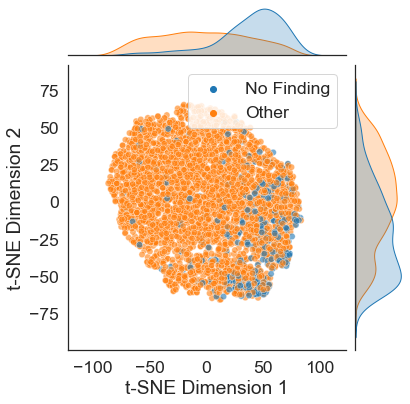

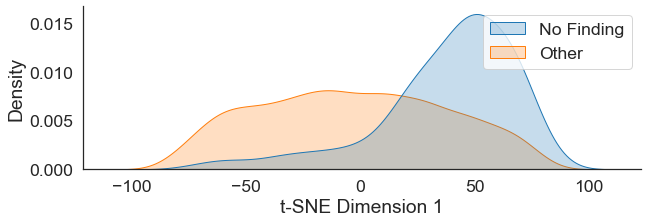

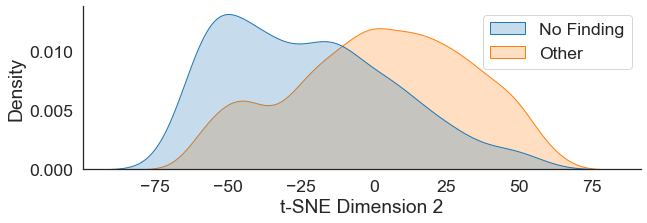

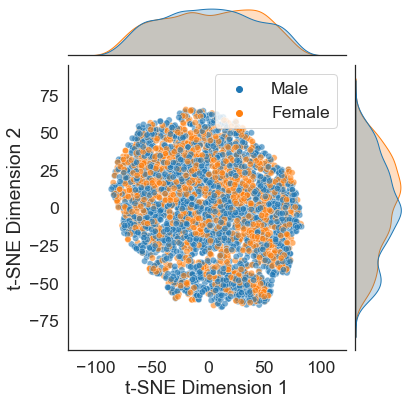

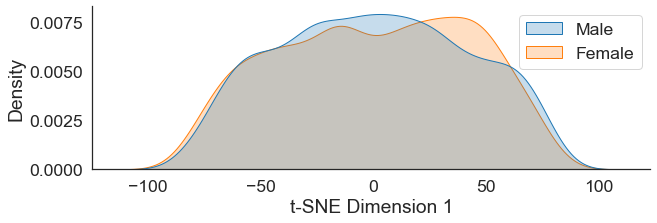

...

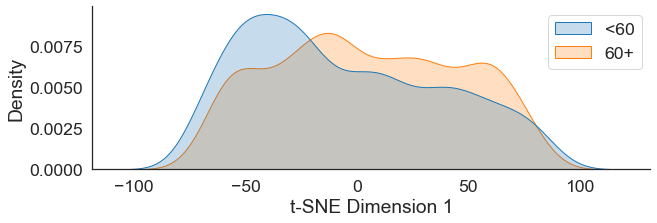

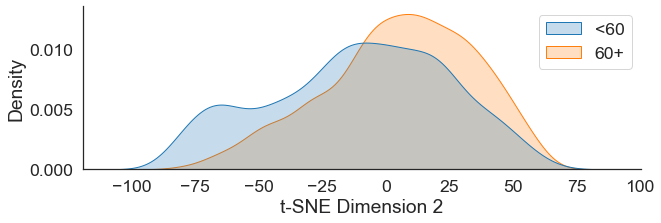

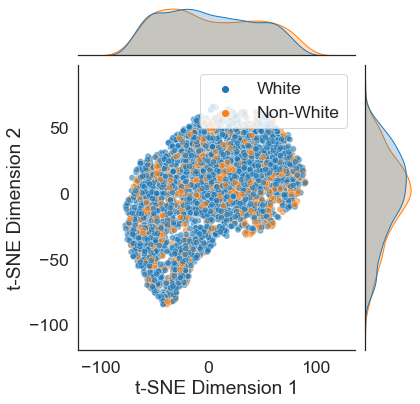

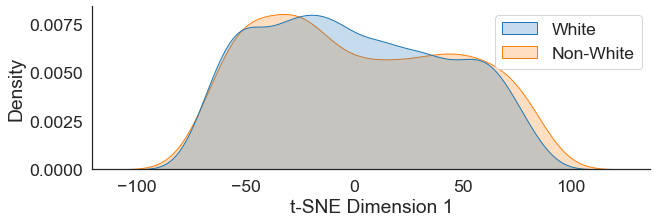

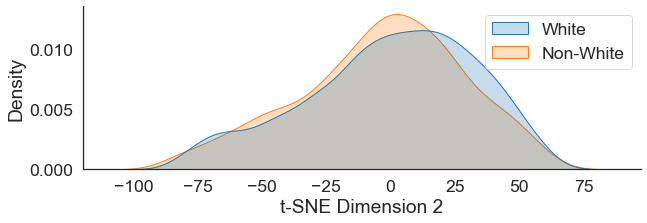

In [32]:
# Resnet18: Seed 46

# Without KD
run_tsne_and_save_plots(
    model_id='r18-sam1-s46',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_white/resnet',
    data_name='chexpert_no_white',
    sample=True,
    teacher=False,
)

# With KD
run_tsne_and_save_plots(
    model_id='r18-sam1-kd1-s46_r34-sam1-s43',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_white/kd',
    data_name='chexpert_no_white',
    sample=True,
    teacher=False,
)

##### ResNet34

r34-sam1-s45



--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,True,True,False,0.0,0.037446,0.0,0.242861
T-SNE 2,True,True,True,False,0.0,0.000000,0.0,0.071998


r34-sam1-kd1-s45_r34-sam1-s43

--- Statistical tests


,label_hypoth,sex_hypoth,age_hypoth,race_hypoth,label_pv,sex_pv,age_pv,race_pv
T-SNE 1,True,True,True,False,0.0,0.000001,0.0,0.080260
T-SNE 2,True,True,True,True,0.0,0.001774,0.0,0.004632


/tmp/ipykernel_2799854/2522073358.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(10,3))


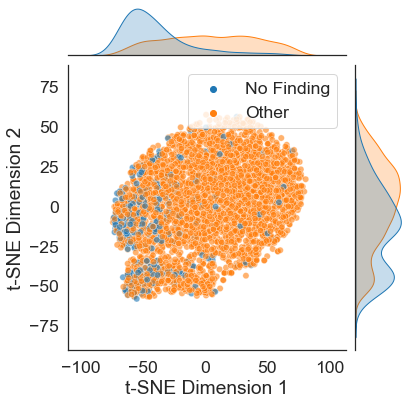

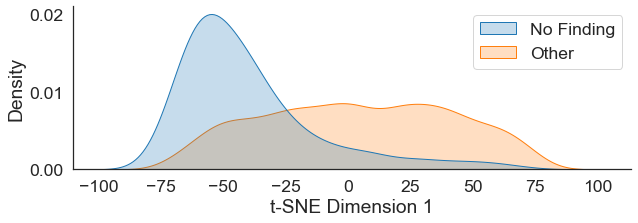

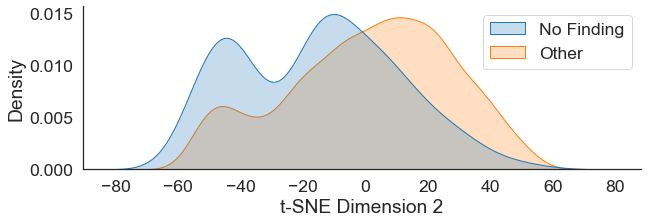

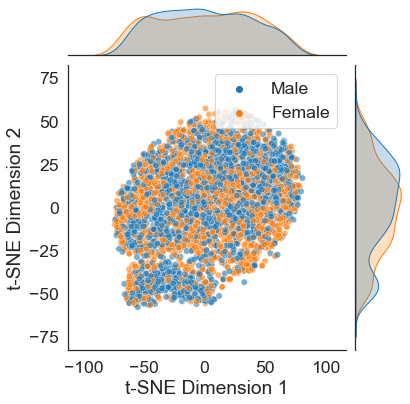

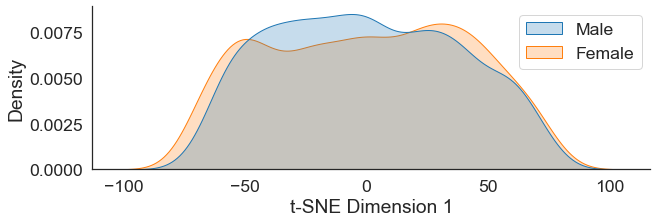

...

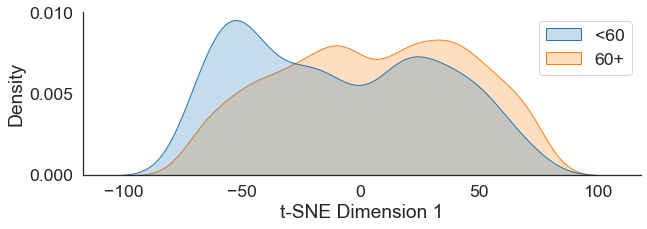

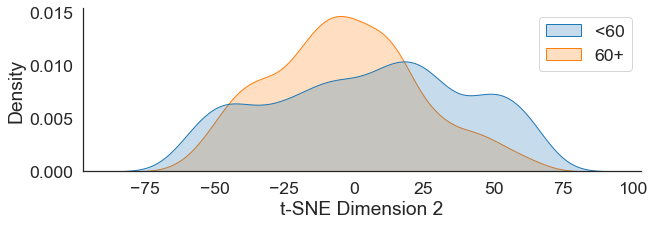

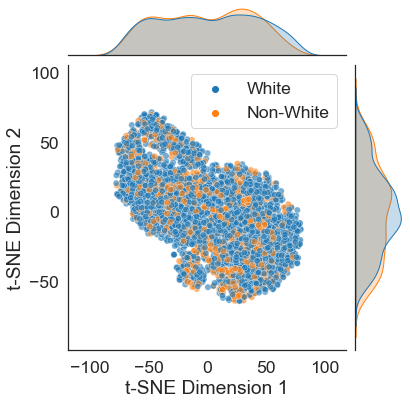

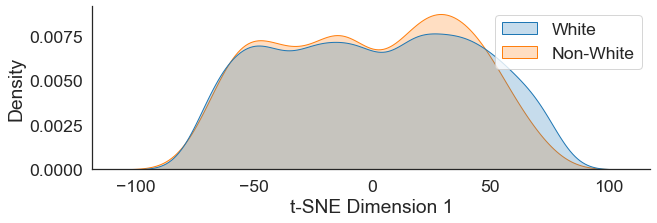

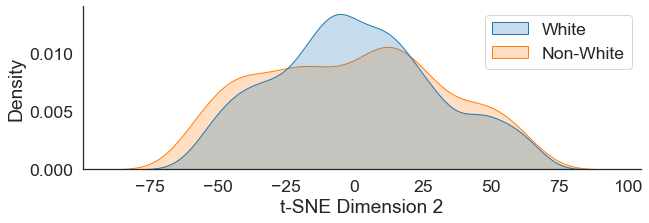

In [33]:
# Resnet34: Seed 45

# Without KD
run_tsne_and_save_plots(
    model_id='r34-sam1-s45',
    model_name='resnet34',
    model_dir='../../results/chexpert_no_white/resnet',
    data_name='chexpert_no_white',
    sample=True,
    teacher=False,
)

# With KD
run_tsne_and_save_plots(
    model_id='r34-sam1-kd1-s45_r34-sam1-s43',
    model_name='resnet18',
    model_dir='../../results/chexpert_no_white/kd',
    data_name='chexpert_no_white',
    sample=True,
    teacher=False,
)